### Студент: Кириллова Екатерина (Институт биоинформатики)

### Внимание! Для корректной работы необходимо установить следующие инструменты:
#### numpy v1.20.2 
`pip install 'numpy==1.20.2'`
#### fetchChromSizes
`conda install -c bioconda ucsc-fetchchromsizes`
#### bedtools v2.27.1
`conda install -c bioconda bedtools`
#### Таблица с исходными данными должна лежать в одной директории с текущим файлом .ipynb

# Методы визуализации агрегированных эпигенетических данных

In [35]:
from time import time
from typing import TextIO
import numpy as np

#### 1. Загружаем файл с длинами хромосом hg19 из базы данных UCSC и сохраняем в локальный текстовый файл:

In [1]:
!fetchChromSizes hg19 > hg19.chrom.sizes

INFO: trying CURL  for database hg19
url: http://hgdownload.soe.ucsc.edu/goldenPath/hg19/bigZips/hg19.chrom.sizes


#### 2. Делим геном на непересекающиеся бины размеров 100bp, 1kbp, 10kbp, 100kpb, 1mb:

In [10]:
!mkdir bins

In [22]:
!bedtools makewindows -g hg19.chrom.sizes -w 100 > './bins/bins100bp.bed' 
!bedtools makewindows -g hg19.chrom.sizes -w 1000 > './bins/bins1kbp.bed' 
!bedtools makewindows -g hg19.chrom.sizes -w 10000 > './bins/bins10kbp.bed' 
!bedtools makewindows -g hg19.chrom.sizes -w 100000 > './bins/bins100kbp.bed' 
!bedtools makewindows -g hg19.chrom.sizes -w 1000000 > './bins/bins1mb.bed' 

####  3. Выполняем сортировку полученных bed-файлов для дальнейшего использования в *bedtools map*:

In [19]:
!cd bins && mkdir bins_sorted

In [23]:
!sort -k1,1 -k2,2n './bins/bins100bp.bed' > './bins/bins_sorted/bins100bp_sorted.bed'
!sort -k1,1 -k2,2n './bins/bins1kbp.bed' > './bins/bins_sorted/bins1kbp_sorted.bed'
!sort -k1,1 -k2,2n './bins/bins10kbp.bed' > './bins/bins_sorted/bins10kbp_sorted.bed'
!sort -k1,1 -k2,2n './bins/bins100kbp.bed' > './bins/bins_sorted/bins100kbp_sorted.bed'
!sort -k1,1 -k2,2n './bins/bins1mb.bed' > './bins/bins_sorted/bins1mb_sorted.bed'

#### 4. Преобразуем исходные данные по methylation level в формате .tsv в файл формата .bed

In [3]:
def tsv_to_bed(input_file, output_file):
    with open(input_file, 'r') as data, open(output_file, 'w') as output:
        data.readline()  # skip header

        while True:
            line = data.readline()

            if not line:
                break

            line = line.replace(".", "\t", 1)
            splited_line = line.split("\t", 2)
            splited_line.insert(1, splited_line[1])
            new_out = '{}\t{}\t{}\t{}'.format(splited_line[0], splited_line[1], splited_line[2], splited_line[3])
            output.write(new_out)

In [6]:
tsv_to_bed('filtered_cytosines_freq.tsv', 'filtered_cytosines_freq.bed')

#### 5. Выполняем сортировку полученного bed-файла с данными по метилированию:

In [7]:
!sort -k1,1 -k2,2n filtered_cytosines_freq.bed > filtered_cytosines_freq_sorted.bed

#### 6. Вычисляем средний уровень метилирования для каждого бина в каждом доноре:

In [24]:
!mkdir avg_methylation_bins

In [25]:
!bedtools map -a './bins/bins_sorted/bins100bp_sorted.bed' -b filtered_cytosines_freq_sorted.bed -c 4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43 -o mean > './avg_methylation_bins/mapped_100bp.bed'
!bedtools map -a './bins/bins_sorted/bins1kbp_sorted.bed' -b filtered_cytosines_freq_sorted.bed -c 4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43 -o mean > './avg_methylation_bins/mapped_1kbp.bed'
!bedtools map -a './bins/bins_sorted/bins10kbp_sorted.bed' -b filtered_cytosines_freq_sorted.bed -c 4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43 -o mean > './avg_methylation_bins/mapped_10kbp.bed'
!bedtools map -a './bins/bins_sorted/bins100kbp_sorted.bed' -b filtered_cytosines_freq_sorted.bed -c 4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43 -o mean > './avg_methylation_bins/mapped_100kbp.bed'
!bedtools map -a './bins/bins_sorted/bins1mb_sorted.bed' -b filtered_cytosines_freq_sorted.bed -c 4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43 -o mean > './avg_methylation_bins/mapped_1mb.bed'

 ***** WARNING: Non numeric value NA in 37.
 ***** WARNING: Non numeric value NA in 40.
 ***** WARNING: Non numeric value NA in 31.
 ***** WARNING: Non numeric value NA in 24.
 ***** WARNING: Non numeric value NA in 24.
 ***** WARNING: Non numeric value NA in 41.
 ***** WARNING: Non numeric value NA in 34.
 ***** WARNING: Non numeric value NA in 34.
 ***** WARNING: Non numeric value NA in 23.
 ***** WARNING: Non numeric value NA in 37.
 ***** WARNING: Non numeric value NA in 39.
 ***** WARNING: Non numeric value NA in 39.
 ***** WARNING: Non numeric value NA in 37.
 ***** WARNING: Non numeric value NA in 37.
 ***** WARNING: Non numeric value NA in 27.
 ***** WARNING: Non numeric value NA in 5.
 ***** WARNING: Non numeric value NA in 40.
 ***** WARNING: Non numeric value NA in 40.
 ***** WARNING: Non numeric value NA in 27.
 ***** WARNING: Non numeric value NA in 37.
 ***** WARNING: Non numeric value NA in 24.
 ***** WARNING: Non numeric value NA in 5.
 ***** WARNING: Non numeric value 

#### 7. Производим расчет коэффициента корреляции Пирсона между данными в бине и в соседнем бине справа.    
#### В полученных bedgraph-файлах с корреляцией все бины сдвинуты на половину длины бина вправо:

In [38]:
class ChromoBin:
    def __init__(self, name, bin_start, bin_end, values: list):
        self.name = name
        self.bin_start = bin_start
        self.bin_end = bin_end
        self.values = values


def chromo_bin_from_line(line: str) -> ChromoBin:
    splited_line = line.split(sep='\t')

    name = splited_line[0]
    bin_start = int(splited_line[1])
    bin_end = int(splited_line[2])

    values = splited_line[3:]

    values_mapped = list(map(parse_value, values))

    return ChromoBin(name, bin_start, bin_end, values_mapped)


def parse_value(val: str):
    if val == '.' or val == '.\n':
        return np.nan
    else:
        return float(val)


def corr(bin1: ChromoBin, bin2: ChromoBin):
    bin1_values = bin1.values
    bin2_values = bin2.values

    np_values1_with_nan = np.array(bin1_values)
    np_values2_with_nan = np.array(bin2_values)

    values1_isnan = np.isnan(bin1_values)
    values2_isnan = np.isnan(bin2_values)
    logical_or = np.logical_or(values1_isnan, values2_isnan)
    bad = ~logical_or

    np_values1 = np.compress(bad, np_values1_with_nan)
    np_values2 = np.compress(bad, np_values2_with_nan)

    corrcoef = np.corrcoef(np_values1, np_values2)
    coef = corrcoef[0, 1]

    return coef


def write_pearson(file: TextIO, chromo_name: str, bin_start: int, bin_end: int, coef):
    line = '{}\t{}\t{}\t{}\n'.format(chromo_name, bin_start, bin_end, coef)

    file.write(line)


def calc_pearson(input_path: str, output_path: str):
    input_file = open(input_path, 'r')
    output_file = open(output_path, 'w')

    counter = 0
    last_time = time()

    try:
        line1 = input_file.readline()

        while True:
            line2 = input_file.readline()

            if not line2:
                break

            bin1 = chromo_bin_from_line(line1)
            bin2 = chromo_bin_from_line(line2)

            if bin1.name == bin2.name:
                pearson = corr(bin1, bin2)

                if not np.isnan(pearson):
                    bin_start = bin1.bin_start + (bin1.bin_end - bin1.bin_start) // 2
                    bin_end = bin2.bin_start + (bin2.bin_end - bin2.bin_start) // 2

                    write_pearson(output_file, bin1.name, bin_start, bin_end, pearson)

            line1 = line2

            counter += 1

            if counter % 1000000 == 0:
                current_time = time()
                print('line: {}, time elapsed: {}'.format(counter, current_time - last_time))
                last_time = current_time

    finally:
        input_file.close()
        output_file.close()

In [26]:
!mkdir pearson

In [40]:
calc_pearson('./avg_methylation_bins/mapped_100bp.bed', './pearson/pearson_100bp.bedgraph')
calc_pearson('./avg_methylation_bins/mapped_1kbp.bed', './pearson/pearson_1kbp.bedgraph')
calc_pearson('./avg_methylation_bins/mapped_10kbp.bed', './pearson/pearson_10kbp.bedgraph')
calc_pearson('./avg_methylation_bins/mapped_100kbp.bed', './pearson/pearson_100kbp.bedgraph')
calc_pearson('./avg_methylation_bins/mapped_1mb.bed', './pearson/pearson_1mb.bedgraph')

line: 1000000, time elapsed: 170.96468901634216
line: 2000000, time elapsed: 168.2674367427826
line: 3000000, time elapsed: 167.76614904403687
line: 4000000, time elapsed: 168.22277760505676
line: 5000000, time elapsed: 168.35636973381042
line: 6000000, time elapsed: 167.33132672309875
line: 7000000, time elapsed: 166.94595646858215
line: 8000000, time elapsed: 168.07617712020874
line: 9000000, time elapsed: 168.0876955986023
line: 10000000, time elapsed: 166.91978216171265
line: 11000000, time elapsed: 168.6658170223236
line: 12000000, time elapsed: 166.96215629577637
line: 13000000, time elapsed: 167.5158076286316
line: 14000000, time elapsed: 167.82906651496887
line: 15000000, time elapsed: 166.47439074516296
line: 16000000, time elapsed: 166.6329333782196
line: 17000000, time elapsed: 168.33373165130615
line: 18000000, time elapsed: 169.28241109848022
line: 19000000, time elapsed: 166.24083590507507
line: 20000000, time elapsed: 166.64107656478882
line: 21000000, time elapsed: 167.

#### 8. Преобразуем bedgraph-файлы с рассчитаной корреляцией в BigWig треки:

In [31]:
!mkdir final_tracks

In [42]:
!bedGraphToBigWig './pearson/pearson_100bp.bedgraph' hg19.chrom.sizes './final_tracks/100bp_track.bw'
!bedGraphToBigWig './pearson/pearson_1kbp.bedgraph' hg19.chrom.sizes './final_tracks/1kbp_track.bw'
!bedGraphToBigWig './pearson/pearson_10kbp.bedgraph' hg19.chrom.sizes './final_tracks/10kbp_track.bw'
!bedGraphToBigWig './pearson/pearson_100kbp.bedgraph' hg19.chrom.sizes './final_tracks/100kbp_track.bw'
!bedGraphToBigWig './pearson/pearson_1mb.bedgraph' hg19.chrom.sizes './final_tracks/1mb_track.bw'

#### 9. Визуализируем результаты в геномном браузере IGV:

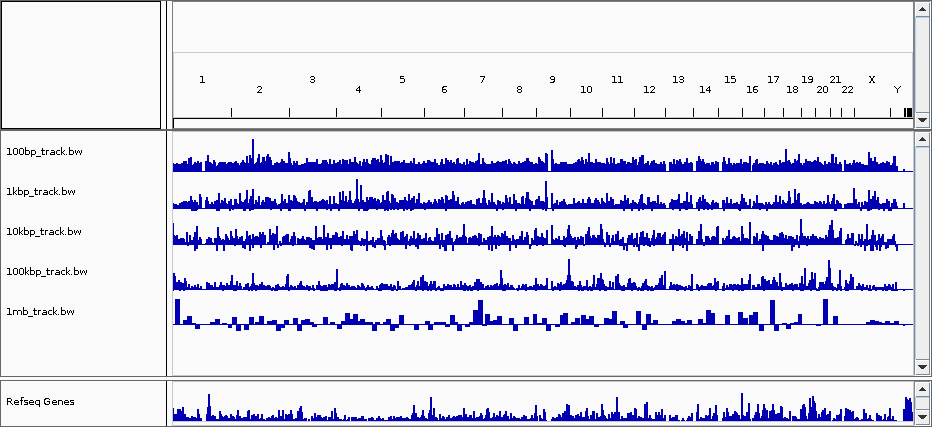